# **Course**: Deep Learning

[<img align="right" width="400" height="100" src="https://www.tu-braunschweig.de/typo3conf/ext/tu_braunschweig/Resources/Public/Images/Logos/tu_braunschweig_logo.svg">](https://www.tu-braunschweig.de/en/)

[Mehdi Maboudi](https://www.tu-braunschweig.de/en/igp/staff/mehdi-maboudi) \([m.maboudi@tu-bs.de](m.maboudi@tu-bs.de)) and [Pedro Achanccaray](https://www.tu-braunschweig.de/en/igp/staff/pedro-diaz) (p.diaz@tu-bs.de)

[Technical University of Braunschweig](https://www.tu-braunschweig.de/en/)  
[Institute of Geodesy and Photogrammetry](https://www.tu-braunschweig.de/igp)

# **Lab 07:** E**X**plainable **AI** (XAI)

In this lab session, we will cover the following topics:
- Explainable AI (XAI)
- GradCAM

For this, we will use the UC Merced dataset for image classification.

There are many methods for Explainable AI. For instance:

- GradCAM: [GitHub](https://github.com/ramprs/grad-cam/), [Paper](https://arxiv.org/pdf/1610.02391.pdf), [Online demo](https://huggingface.co/spaces/jkang/demo-gradcam-imagenet)
- GradCAM++: [GitHub](https://github.com/jacobgil/pytorch-grad-cam), [Paper](https://arxiv.org/pdf/1710.11063.pdf)
- Layer-wise relevance propagation: [GitHub](https://github.com/prashanth41/Layer-wise_relevance_propagation), [Paper](https://link.springer.com/chapter/10.1007/978-3-030-28954-6_10), [Online demo](https://lrpserver.hhi.fraunhofer.de/image-classification)
- ...

More information:
- [Explainable AI (XAI): A survey of recents methods, applications and frameworks](https://theaisummer.com/xai/)
- [Explainable AI Methods - A Brief Overview](https://link.springer.com/chapter/10.1007/978-3-031-04083-2_2)

## **Mount Google Drive to Google Colab**

You can **skip** the following cells if you **do not want to storage** the trained model in your Google Drive.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Change **this path** to the **path of a folder** in your Google Drive to storage the files associated to this session (trained model, figures for visualization, etc.)

In [2]:
# %cd drive/MyDrive/PATH/TO/YOUR/FOLDER
%cd drive/MyDrive/Colabs/DeepLearning_course/Lab_04

/content/drive/MyDrive/Colabs/DeepLearning_course/Lab_04


## **Load packages and data**

In [3]:
# Management of files
import os
from os.path import exists, join

# Tensorflow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.callbacks import ModelCheckpoint, \
                                       EarlyStopping
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input

# Albumentations for data augmentation
from albumentations import Blur, \
                           Compose, \
                           HorizontalFlip, \
                           RandomBrightnessContrast, \
                           RandomRotate90, \
                           VerticalFlip

# Reading images
import tifffile
import cv2

# Working with arrays
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# External files with functions to load the dataset,
# create a CNN model, and a data generator.
from importlib import reload
import datasets
import data_generator_fine_tune
import gradcam
# Useful to reload modified external files without need
# of restarting the kernel. Just run again this cell.
reload(datasets)
reload(data_generator_fine_tune)
reload(gradcam)

from datasets import *
from data_generator_fine_tune import *
from gradcam import *

**Variables**

In [61]:
PROJECT_DIR = "." # os.getcwd()
SEED = 42
BATCH_SIZE = 32
TARGET_SIZE = 256
EPOCHS = 200

### **Download the dataset**

In [5]:
download_ucmerced(PROJECT_DIR)

### **Reading the dataset**

In [6]:
path_data = join(PROJECT_DIR, "UCMerced_LandUse", "Images")

df, n_classes = read_ucmerced(path_data=path_data, SEED=SEED)
classes = np.unique(df["class_str"].values)
classes_int = np.arange(len(classes))
classes_dict = dict(zip(classes, classes_int))

df

,path_image,class_str,class_int
0,./UCMerced_LandUse/Images/harbor/harbor34.tif,harbor,10
1,./UCMerced_LandUse/Images/intersection/interse...,intersection,11
2,./UCMerced_LandUse/Images/agricultural/agricul...,agricultural,0
3,./UCMerced_LandUse/Images/mobilehomepark/mobil...,mobilehomepark,13
4,./UCMerced_LandUse/Images/denseresidential/den...,denseresidential,6
...,...,...,...
2095,./UCMerced_LandUse/Images/river/river38.tif,river,16
2096,./UCMerced_LandUse/Images/harbor/harbor95.tif,harbor,10
2097,./UCMerced_LandUse/Images/intersection/interse...,intersection,11
2098,./UCMerced_LandUse/Images/mediumresidential/me...,mediumresidential,12


### **Train, Validation and Test sets**

In [7]:
splits = train_val_test_split(df,
                              val_size=0.2,
                              test_size=0.2,
                              SEED=SEED)

x_train = splits["x_train"]
y_train = splits["y_train"]
x_val = splits["x_val"]
y_val = splits["y_val"]
x_test = splits["x_test"]
y_test = splits["y_test"]

## **Data generator**

In [8]:
def augmentation():
  return Compose([HorizontalFlip(p=0.5),
                  VerticalFlip(p=0.5),
                  RandomRotate90(p=0.5),
                  Blur(p=0.01, blur_limit=3),
                  RandomBrightnessContrast(p=0.5),
                  ], p = 1)

In [62]:
data_gen_train = DataGenerator(path_images=x_train,
                               labels=y_train,
                               batch_size=BATCH_SIZE,
                               n_classes=n_classes,
                               target_size=TARGET_SIZE,
                               augmentation=augmentation,
                               shuffle=True)

data_gen_val = DataGenerator(path_images=x_val,
                             labels=y_val,
                             batch_size=BATCH_SIZE,
                             n_classes=n_classes,
                             target_size=TARGET_SIZE,
                             shuffle=False)

## **Classification model**

In [123]:
def get_vgg_model(n_classes, input_shape):
  # Pre-trained model VGG16 with ImageNet
  base_model = VGG16(weights="imagenet",
                      include_top=False,
                      input_shape=input_shape,
                      classes=n_classes
                      )
  base_model.trainable = False

  input = Input(shape=input_shape)
  x = preprocess_input(input)

  x = base_model.output
  x = Flatten()(x)
  x = Dense(100, activation="relu")(x)
  x = Dense(50, activation="relu")(x)
  x = Dense(n_classes, activation="softmax")(x)

  model = Model(inputs=base_model.input, outputs=x)

  model.compile(optimizer=Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=['accuracy']
                )
  return model

In [124]:
vgg16_fine_tune = get_vgg_model(n_classes=n_classes,
                                      input_shape=(TARGET_SIZE,TARGET_SIZE,3))

vgg16_fine_tune.summary()

Model: "model_326"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0 

### **Model configuration and callbacks**

In [125]:
class PlotGradCAM(keras.callbacks.Callback):
  def __init__(self, data, n_images=3):
    super().__init__()
    self.data = data
    self.n_images = n_images

  def on_epoch_end(self, epoch, logs=None):
    plt.figure(figsize=(15,30))
    for i in range(self.n_images):
      # input data
      x = self.data[0][i]
      x_orig = x.astype(np.uint8)
      x = np.expand_dims(x, axis=0)
      # reference class
      y = np.argmax(self.data[1][i])
      # predicted class
      y_pred = self.model.predict(x,verbose=0)
      id_class_pred = np.argmax(y_pred[0])
      str_class_pred = list(classes_dict.keys())[id_class_pred]
      str_class_ref = list(classes_dict.keys())[y]
      # compute GradCAM
      cam = GradCAM(self.model, id_class_pred)
      heatmap = cam.compute_heatmap(x)
      (heatmap, output) = cam.overlay_heatmap(heatmap, x_orig, alpha=0.5)
      # show the first self.n_images in a batch
      plt.subplot(1,self.n_images,i+1)
      plt.imshow(output)
      plt.title("R:{}\nP:{}".format(str_class_ref, str_class_pred), fontsize=8)
      plt.axis("off")
    plt.show()

In [126]:
# Callbacks

# Checkpoints
autosave = ModelCheckpoint("vgg16_finetune.h5",
                           mode="max",
                           save_best_only=True,
                           monitor="val_accuracy",
                           verbose=1)

# Early stopping
early_stop = EarlyStopping(patience=20,
                           verbose=1,
                           mode="max",
                           monitor="val_accuracy")

# Change the index of the data generator to visualize other batch during training
cbks = [autosave,
        early_stop,
        PlotGradCAM(data=data_gen_train[0],
                    n_images=9)]

## **Training the model**

Epoch 1/200
40/40 [==============================] - ETA: 0s - loss: 5.9045 - accuracy: 0.3532
Epoch 1: val_accuracy improved from -inf to 0.54524, saving model to vgg16_finetune.h5


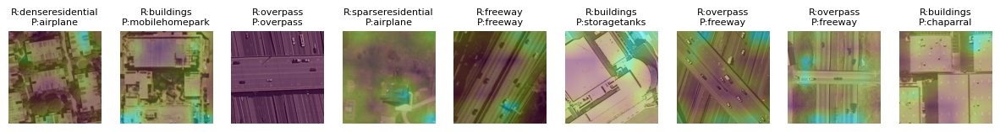

40/40 [==============================] - 14s 300ms/step - loss: 5.9045 - accuracy: 0.3532 - val_loss: 1.7217 - val_accuracy: 0.5452
Epoch 2/200
40/40 [==============================] - ETA: 0s - loss: 1.3145 - accuracy: 0.6841
Epoch 2: val_accuracy improved from 0.54524 to 0.69524, saving model to vgg16_finetune.h5


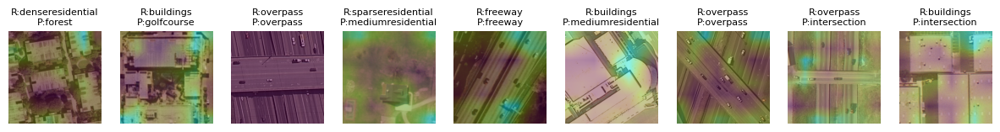

40/40 [==============================] - 11s 268ms/step - loss: 1.3145 - accuracy: 0.6841 - val_loss: 1.2066 - val_accuracy: 0.6952
Epoch 3/200
40/40 [==============================] - ETA: 0s - loss: 0.8772 - accuracy: 0.7897
Epoch 3: val_accuracy improved from 0.69524 to 0.75476, saving model to vgg16_finetune.h5


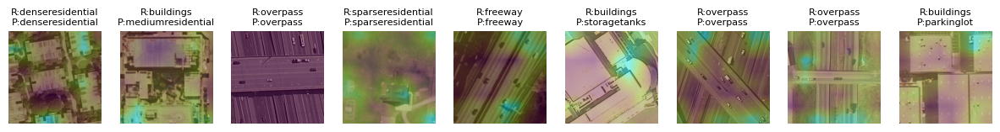

40/40 [==============================] - 11s 272ms/step - loss: 0.8772 - accuracy: 0.7897 - val_loss: 1.0508 - val_accuracy: 0.7548
Epoch 4/200
40/40 [==============================] - ETA: 0s - loss: 0.5977 - accuracy: 0.8452
Epoch 4: val_accuracy improved from 0.75476 to 0.78810, saving model to vgg16_finetune.h5


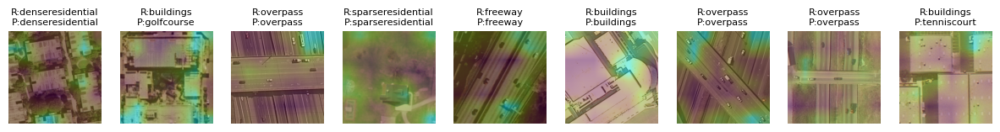

40/40 [==============================] - 11s 266ms/step - loss: 0.5977 - accuracy: 0.8452 - val_loss: 0.8810 - val_accuracy: 0.7881
Epoch 5/200
40/40 [==============================] - ETA: 0s - loss: 0.5895 - accuracy: 0.8627
Epoch 5: val_accuracy did not improve from 0.78810


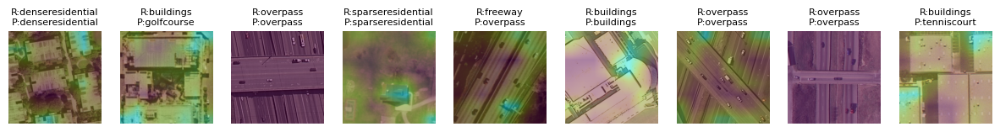

40/40 [==============================] - 10s 261ms/step - loss: 0.5895 - accuracy: 0.8627 - val_loss: 1.1636 - val_accuracy: 0.7643
Epoch 6/200
40/40 [==============================] - ETA: 0s - loss: 0.5351 - accuracy: 0.8651
Epoch 6: val_accuracy improved from 0.78810 to 0.82143, saving model to vgg16_finetune.h5


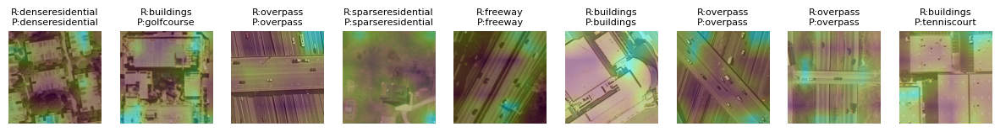

40/40 [==============================] - 11s 281ms/step - loss: 0.5351 - accuracy: 0.8651 - val_loss: 1.0297 - val_accuracy: 0.8214
Epoch 7/200
40/40 [==============================] - ETA: 0s - loss: 0.4697 - accuracy: 0.8873
Epoch 7: val_accuracy improved from 0.82143 to 0.83571, saving model to vgg16_finetune.h5


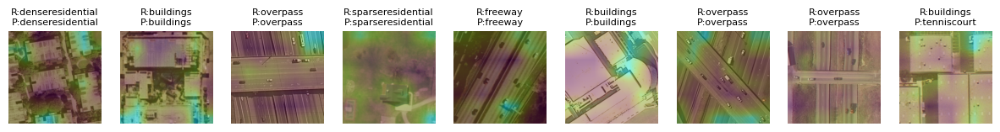

40/40 [==============================] - 12s 293ms/step - loss: 0.4697 - accuracy: 0.8873 - val_loss: 0.8144 - val_accuracy: 0.8357
Epoch 8/200
40/40 [==============================] - ETA: 0s - loss: 0.3917 - accuracy: 0.9127
Epoch 8: val_accuracy did not improve from 0.83571


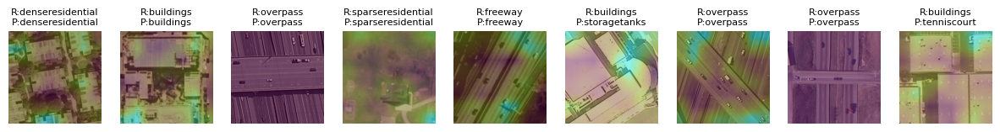

40/40 [==============================] - 10s 255ms/step - loss: 0.3917 - accuracy: 0.9127 - val_loss: 1.1218 - val_accuracy: 0.8048
Epoch 9/200
40/40 [==============================] - ETA: 0s - loss: 0.5123 - accuracy: 0.9087
Epoch 9: val_accuracy did not improve from 0.83571


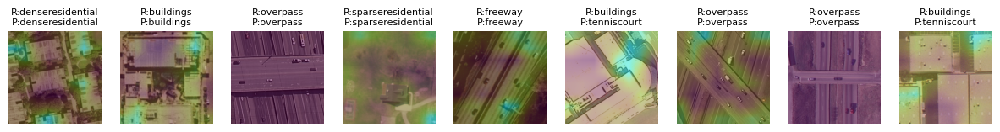

40/40 [==============================] - 10s 250ms/step - loss: 0.5123 - accuracy: 0.9087 - val_loss: 1.3000 - val_accuracy: 0.7881
Epoch 10/200
40/40 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.9190
Epoch 10: val_accuracy improved from 0.83571 to 0.85238, saving model to vgg16_finetune.h5


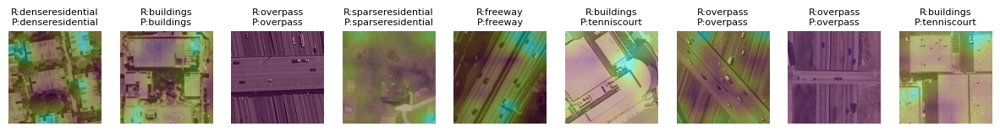

40/40 [==============================] - 11s 282ms/step - loss: 0.3160 - accuracy: 0.9190 - val_loss: 0.8970 - val_accuracy: 0.8524
Epoch 11/200
40/40 [==============================] - ETA: 0s - loss: 0.3287 - accuracy: 0.9214
Epoch 11: val_accuracy did not improve from 0.85238


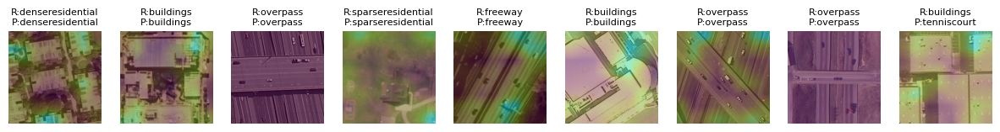

40/40 [==============================] - 10s 252ms/step - loss: 0.3287 - accuracy: 0.9214 - val_loss: 1.0808 - val_accuracy: 0.8095
Epoch 12/200
40/40 [==============================] - ETA: 0s - loss: 0.4393 - accuracy: 0.9119
Epoch 12: val_accuracy did not improve from 0.85238


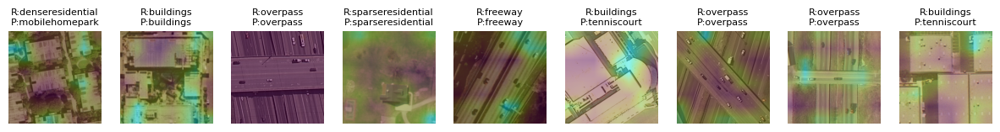

40/40 [==============================] - 10s 256ms/step - loss: 0.4393 - accuracy: 0.9119 - val_loss: 0.9500 - val_accuracy: 0.8071
Epoch 13/200
40/40 [==============================] - ETA: 0s - loss: 0.3485 - accuracy: 0.9254
Epoch 13: val_accuracy improved from 0.85238 to 0.86667, saving model to vgg16_finetune.h5


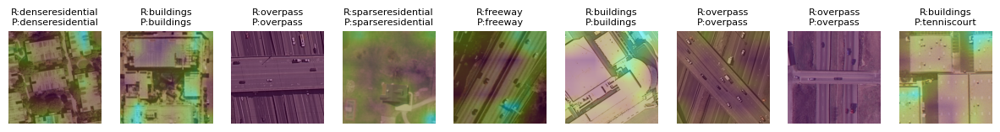

40/40 [==============================] - 11s 286ms/step - loss: 0.3485 - accuracy: 0.9254 - val_loss: 1.0336 - val_accuracy: 0.8667
Epoch 14/200
40/40 [==============================] - ETA: 0s - loss: 0.4140 - accuracy: 0.9278
Epoch 14: val_accuracy improved from 0.86667 to 0.87143, saving model to vgg16_finetune.h5


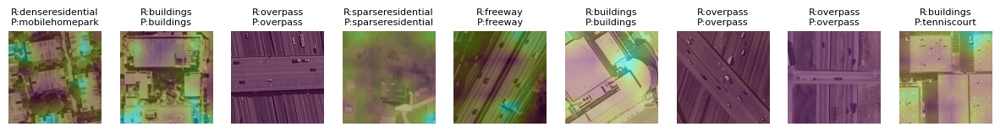

40/40 [==============================] - 10s 257ms/step - loss: 0.4140 - accuracy: 0.9278 - val_loss: 0.9494 - val_accuracy: 0.8714
Epoch 15/200
40/40 [==============================] - ETA: 0s - loss: 0.2066 - accuracy: 0.9476
Epoch 15: val_accuracy did not improve from 0.87143


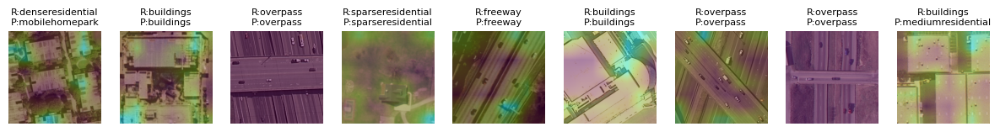

40/40 [==============================] - 11s 250ms/step - loss: 0.2066 - accuracy: 0.9476 - val_loss: 0.9946 - val_accuracy: 0.8571
Epoch 16/200
40/40 [==============================] - ETA: 0s - loss: 0.1765 - accuracy: 0.9540
Epoch 16: val_accuracy did not improve from 0.87143


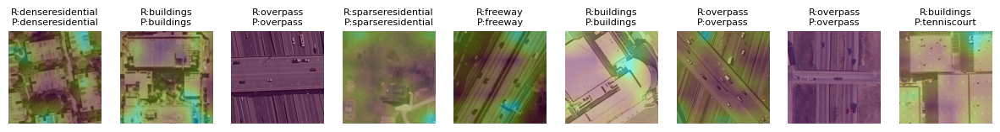

40/40 [==============================] - 10s 249ms/step - loss: 0.1765 - accuracy: 0.9540 - val_loss: 0.9453 - val_accuracy: 0.8548
Epoch 17/200
40/40 [==============================] - ETA: 0s - loss: 0.2288 - accuracy: 0.9508
Epoch 17: val_accuracy improved from 0.87143 to 0.87619, saving model to vgg16_finetune.h5


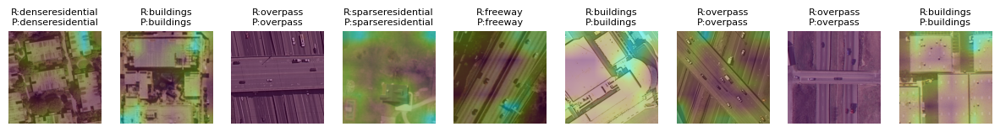

40/40 [==============================] - 13s 314ms/step - loss: 0.2288 - accuracy: 0.9508 - val_loss: 1.0508 - val_accuracy: 0.8762
Epoch 18/200
40/40 [==============================] - ETA: 0s - loss: 0.2259 - accuracy: 0.9548
Epoch 18: val_accuracy improved from 0.87619 to 0.88571, saving model to vgg16_finetune.h5


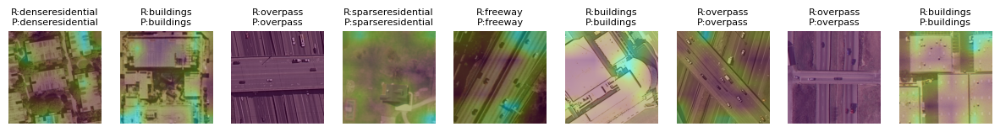

40/40 [==============================] - 11s 274ms/step - loss: 0.2259 - accuracy: 0.9548 - val_loss: 0.9378 - val_accuracy: 0.8857
Epoch 19/200
40/40 [==============================] - ETA: 0s - loss: 0.1133 - accuracy: 0.9714
Epoch 19: val_accuracy did not improve from 0.88571


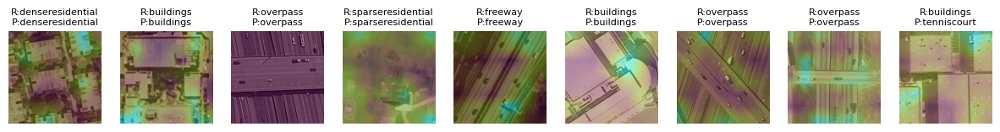

40/40 [==============================] - 10s 253ms/step - loss: 0.1133 - accuracy: 0.9714 - val_loss: 0.8801 - val_accuracy: 0.8524
Epoch 20/200
40/40 [==============================] - ETA: 0s - loss: 0.0980 - accuracy: 0.9754
Epoch 20: val_accuracy improved from 0.88571 to 0.89524, saving model to vgg16_finetune.h5


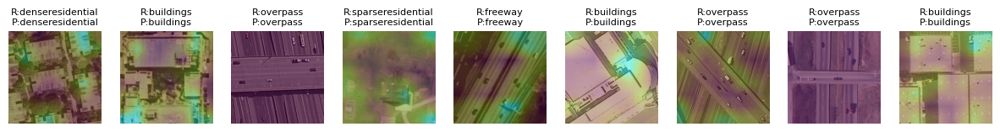

40/40 [==============================] - 12s 290ms/step - loss: 0.0980 - accuracy: 0.9754 - val_loss: 0.7884 - val_accuracy: 0.8952
Epoch 21/200
40/40 [==============================] - ETA: 0s - loss: 0.1471 - accuracy: 0.9651
Epoch 21: val_accuracy did not improve from 0.89524


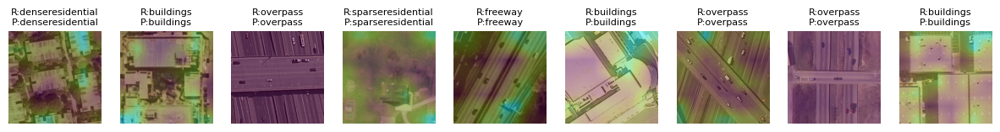

40/40 [==============================] - 11s 268ms/step - loss: 0.1471 - accuracy: 0.9651 - val_loss: 0.8570 - val_accuracy: 0.8714
Epoch 22/200
40/40 [==============================] - ETA: 0s - loss: 0.1310 - accuracy: 0.9698
Epoch 22: val_accuracy did not improve from 0.89524


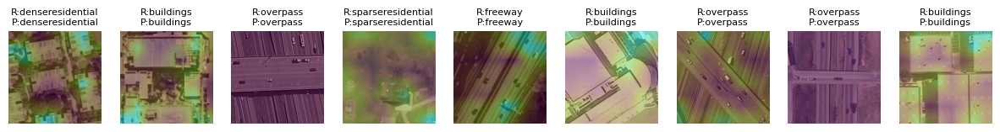

40/40 [==============================] - 10s 257ms/step - loss: 0.1310 - accuracy: 0.9698 - val_loss: 1.3213 - val_accuracy: 0.8095
Epoch 23/200
40/40 [==============================] - ETA: 0s - loss: 0.1445 - accuracy: 0.9587
Epoch 23: val_accuracy did not improve from 0.89524


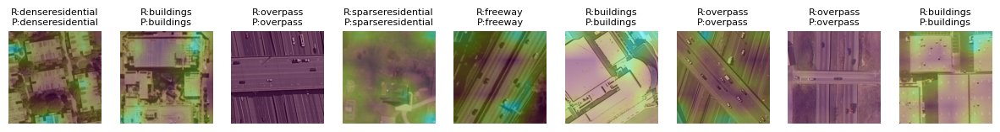

40/40 [==============================] - 10s 251ms/step - loss: 0.1445 - accuracy: 0.9587 - val_loss: 1.1279 - val_accuracy: 0.8667
Epoch 24/200
40/40 [==============================] - ETA: 0s - loss: 0.1453 - accuracy: 0.9690
Epoch 24: val_accuracy did not improve from 0.89524


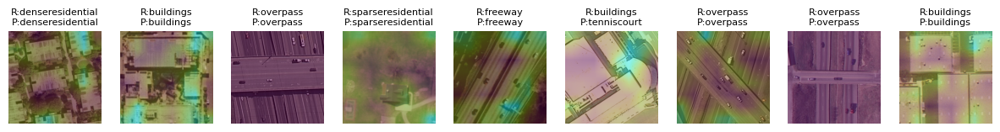

40/40 [==============================] - 10s 251ms/step - loss: 0.1453 - accuracy: 0.9690 - val_loss: 1.0671 - val_accuracy: 0.8762
Epoch 25/200
40/40 [==============================] - ETA: 0s - loss: 0.1430 - accuracy: 0.9714
Epoch 25: val_accuracy did not improve from 0.89524


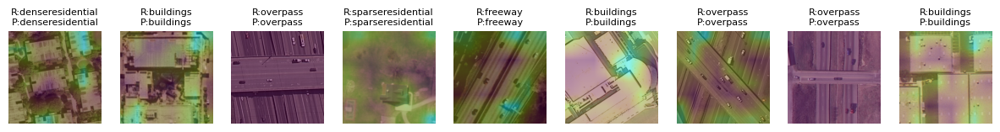

40/40 [==============================] - 10s 252ms/step - loss: 0.1430 - accuracy: 0.9714 - val_loss: 1.0841 - val_accuracy: 0.8738
Epoch 26/200
40/40 [==============================] - ETA: 0s - loss: 0.2078 - accuracy: 0.9579
Epoch 26: val_accuracy did not improve from 0.89524


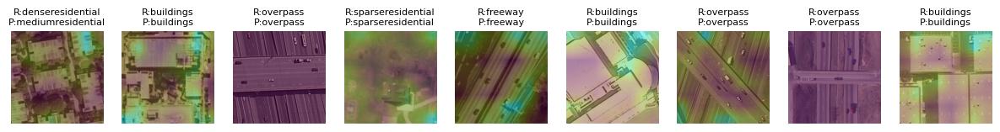

40/40 [==============================] - 10s 251ms/step - loss: 0.2078 - accuracy: 0.9579 - val_loss: 1.0197 - val_accuracy: 0.8619
Epoch 27/200
40/40 [==============================] - ETA: 0s - loss: 0.0834 - accuracy: 0.9754
Epoch 27: val_accuracy did not improve from 0.89524


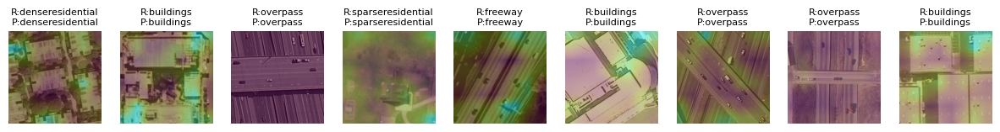

40/40 [==============================] - 10s 253ms/step - loss: 0.0834 - accuracy: 0.9754 - val_loss: 0.9561 - val_accuracy: 0.8786
Epoch 28/200
40/40 [==============================] - ETA: 0s - loss: 0.1899 - accuracy: 0.9714
Epoch 28: val_accuracy did not improve from 0.89524


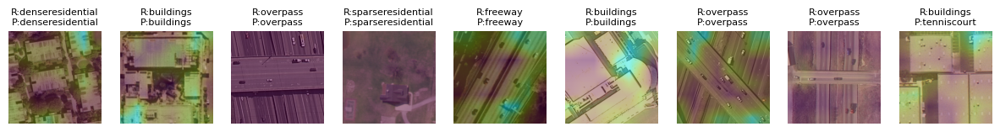

40/40 [==============================] - 10s 252ms/step - loss: 0.1899 - accuracy: 0.9714 - val_loss: 1.1662 - val_accuracy: 0.8905
Epoch 29/200
40/40 [==============================] - ETA: 0s - loss: 0.1363 - accuracy: 0.9698
Epoch 29: val_accuracy did not improve from 0.89524


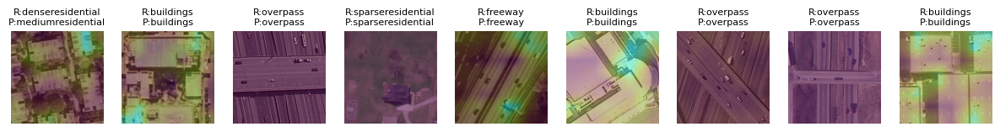

40/40 [==============================] - 11s 263ms/step - loss: 0.1363 - accuracy: 0.9698 - val_loss: 1.3935 - val_accuracy: 0.8548
Epoch 30/200
40/40 [==============================] - ETA: 0s - loss: 0.1219 - accuracy: 0.9738
Epoch 30: val_accuracy did not improve from 0.89524


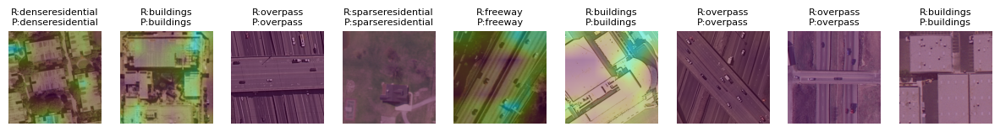

40/40 [==============================] - 10s 250ms/step - loss: 0.1219 - accuracy: 0.9738 - val_loss: 1.3554 - val_accuracy: 0.8833
Epoch 31/200
40/40 [==============================] - ETA: 0s - loss: 0.1601 - accuracy: 0.9683
Epoch 31: val_accuracy did not improve from 0.89524


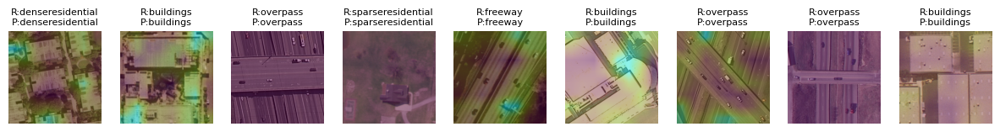

40/40 [==============================] - 10s 251ms/step - loss: 0.1601 - accuracy: 0.9683 - val_loss: 1.3969 - val_accuracy: 0.8476
Epoch 32/200
40/40 [==============================] - ETA: 0s - loss: 0.1350 - accuracy: 0.9714
Epoch 32: val_accuracy did not improve from 0.89524


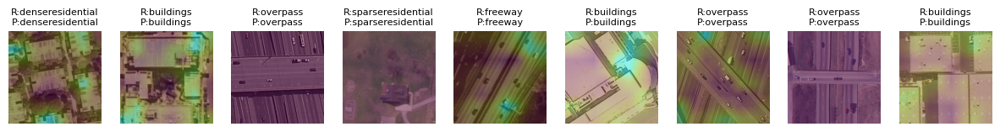

40/40 [==============================] - 10s 252ms/step - loss: 0.1350 - accuracy: 0.9714 - val_loss: 1.1233 - val_accuracy: 0.8738
Epoch 33/200
40/40 [==============================] - ETA: 0s - loss: 0.1094 - accuracy: 0.9786
Epoch 33: val_accuracy did not improve from 0.89524


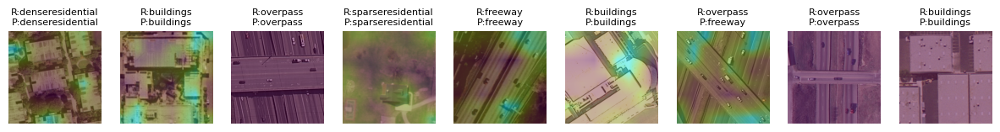

40/40 [==============================] - 10s 252ms/step - loss: 0.1094 - accuracy: 0.9786 - val_loss: 1.3594 - val_accuracy: 0.8643
Epoch 34/200
40/40 [==============================] - ETA: 0s - loss: 0.1280 - accuracy: 0.9730
Epoch 34: val_accuracy did not improve from 0.89524


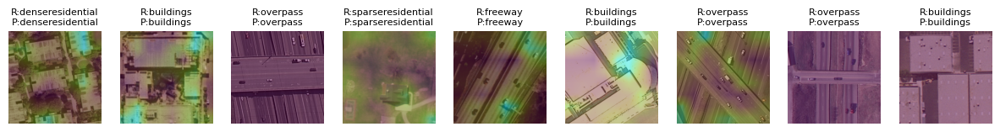

40/40 [==============================] - 10s 253ms/step - loss: 0.1280 - accuracy: 0.9730 - val_loss: 1.0670 - val_accuracy: 0.8667
Epoch 35/200
40/40 [==============================] - ETA: 0s - loss: 0.1635 - accuracy: 0.9738
Epoch 35: val_accuracy did not improve from 0.89524


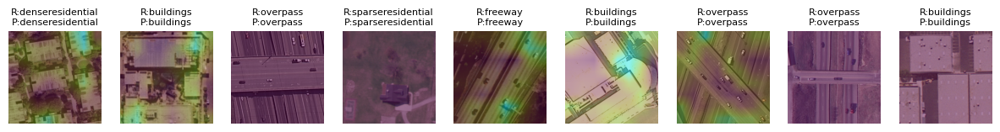

40/40 [==============================] - 10s 254ms/step - loss: 0.1635 - accuracy: 0.9738 - val_loss: 1.3197 - val_accuracy: 0.8857
Epoch 36/200
40/40 [==============================] - ETA: 0s - loss: 0.1316 - accuracy: 0.9706
Epoch 36: val_accuracy did not improve from 0.89524


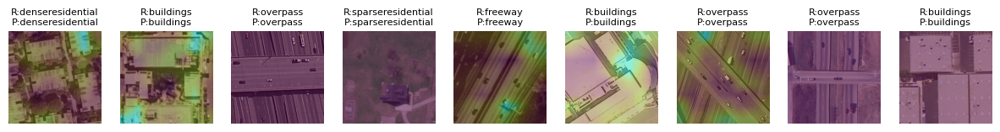

40/40 [==============================] - 11s 263ms/step - loss: 0.1316 - accuracy: 0.9706 - val_loss: 1.2946 - val_accuracy: 0.8738
Epoch 37/200
40/40 [==============================] - ETA: 0s - loss: 0.0743 - accuracy: 0.9833
Epoch 37: val_accuracy did not improve from 0.89524


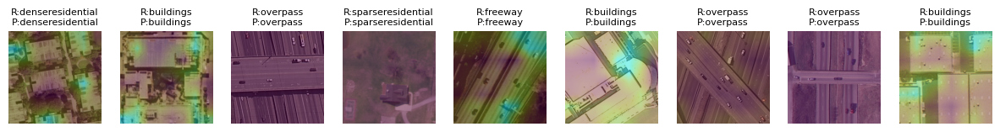

40/40 [==============================] - 10s 252ms/step - loss: 0.0743 - accuracy: 0.9833 - val_loss: 0.9656 - val_accuracy: 0.8929
Epoch 38/200
40/40 [==============================] - ETA: 0s - loss: 0.0864 - accuracy: 0.9857
Epoch 38: val_accuracy did not improve from 0.89524


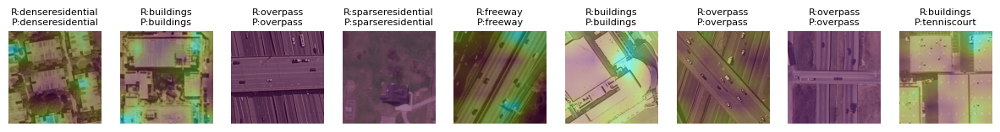

40/40 [==============================] - 10s 252ms/step - loss: 0.0864 - accuracy: 0.9857 - val_loss: 1.1051 - val_accuracy: 0.8881
Epoch 39/200
40/40 [==============================] - ETA: 0s - loss: 0.1737 - accuracy: 0.9738
Epoch 39: val_accuracy did not improve from 0.89524


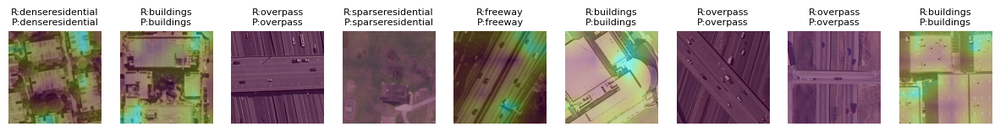

40/40 [==============================] - 10s 253ms/step - loss: 0.1737 - accuracy: 0.9738 - val_loss: 1.4294 - val_accuracy: 0.8667
Epoch 40/200
40/40 [==============================] - ETA: 0s - loss: 0.1104 - accuracy: 0.9722
Epoch 40: val_accuracy did not improve from 0.89524


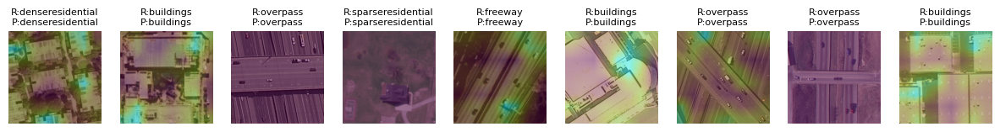

40/40 [==============================] - 10s 259ms/step - loss: 0.1104 - accuracy: 0.9722 - val_loss: 0.9736 - val_accuracy: 0.8786
Epoch 40: early stopping


In [127]:
history = vgg16_fine_tune.fit(data_gen_train,
                              epochs=EPOCHS,
                              validation_data=data_gen_val,
                              callbacks=cbks
                              )

## **Testing the model**

In [128]:
vgg16_fine_tune.load_weights("vgg16_finetune.h5")

In [129]:
data_gen_test = DataGenerator(path_images=x_test,
                              labels=y_test,
                              batch_size=BATCH_SIZE,
                              n_classes=n_classes,
                              target_size=TARGET_SIZE,
                              shuffle=False)

print("Train:")
scores_train_2 = vgg16_fine_tune.evaluate(data_gen_train)

print("Validation:")
scores_val_2 = vgg16_fine_tune.evaluate(data_gen_val)

print("Test:")
scores_test_2 = vgg16_fine_tune.evaluate(data_gen_test)

Train:
40/40 [==============================] - 6s 153ms/step - loss: 0.1165 - accuracy: 0.9714
Validation:
14/14 [==============================] - 2s 149ms/step - loss: 0.7884 - accuracy: 0.8952
Test:
14/14 [==============================] - 2s 149ms/step - loss: 0.9040 - accuracy: 0.8643


In [130]:
print("Train: Loss={}, Accuracy={}".format(scores_train_2[0],scores_train_2[1]))
print("Validation: Loss={}, Accuracy={}".format(scores_val_2[0],scores_val_2[1]))
print("Test: Loss={}, Accuracy={}".format(scores_test_2[0],scores_test_2[1]))

Train: Loss=0.11645310372114182, Accuracy=0.9714285731315613
Validation: Loss=0.7884101271629333, Accuracy=0.8952381014823914
Test: Loss=0.9040108323097229, Accuracy=0.8642857074737549


## **GradCAM**

GradCAM implementation based on:
- [Grad-CAM: Visualize class activation maps with Keras, TensorFlow, and Deep Learning](https://pyimagesearch.com/2020/03/09/grad-cam-visualize-class-activation-maps-with-keras-tensorflow-and-deep-learning/)
- [Understand your Algorithm with Grad-CAM](https://towardsdatascience.com/understand-your-algorithm-with-grad-cam-d3b62fce353)

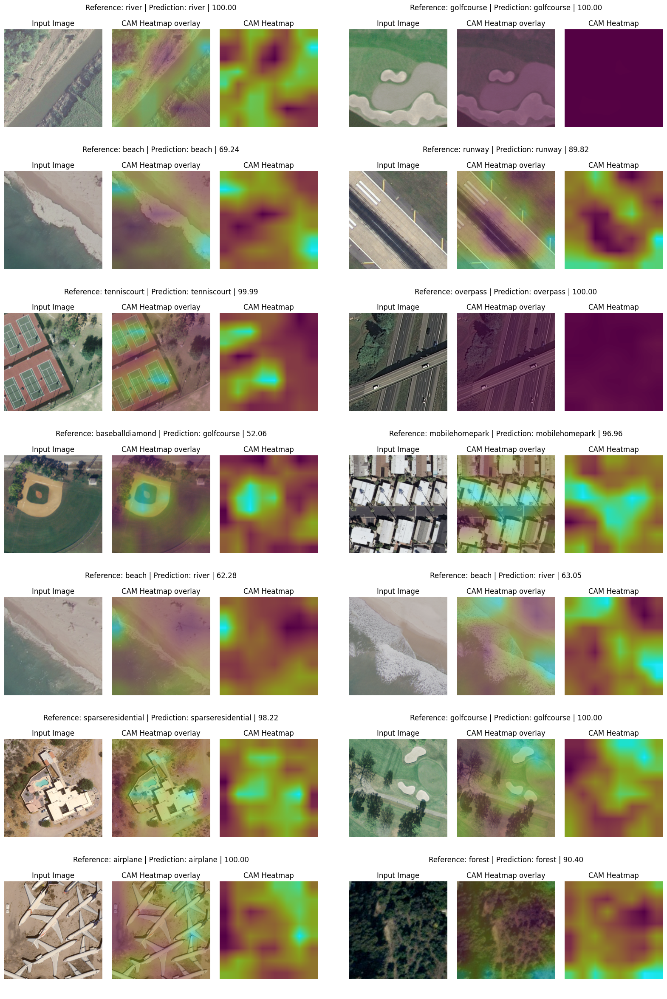

In [132]:
rows = 7
cols = 2
start = 100

fig = plt.figure(figsize=(20,30))
outer = gridspec.GridSpec(rows, cols, wspace=0.1, hspace=0.1)

for id, x_i_path in enumerate(x_test[start:start + rows*cols]):
  # Reading the image, resize it
  # add one dimension, convert to float
  # apply preprocessing function for VGG16
  x_i_orig = tifffile.imread(x_i_path)
  x_i_orig = np.resize(x_i_orig,(256,256,3))
  x_i = np.expand_dims(x_i_orig, axis=0)
  x_i = x_i.astype("float")
  x_i = preprocess_input(x_i)

  # Prediction
  preds = vgg16_fine_tune.predict(x_i, verbose=0)
  probs = preds[0].max()
  id_class_pred = np.argmax(preds[0])
  str_class_pred = list(classes_dict.keys())[id_class_pred]
  str_class_ref = list(classes_dict.keys())[y_test[start + id]]

  # GradCAM using the last convolutional layer, get the heatmap
  # and overlay it to the input image
  cam = GradCAM(vgg16_fine_tune, id_class_pred)
  heatmap = cam.compute_heatmap(x_i)
  (heatmap, output) = cam.overlay_heatmap(heatmap, x_i_orig, alpha=0.5)

  # Plot with the reference and prediction, input image, overlay and heatmap
  inner = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=outer[id], wspace=0.1, hspace=0.1)
  ax = plt.Subplot(fig, outer[id])
  ax.set_title("Reference: {} | Prediction: {} | {:.2f}".format(str_class_ref,
                                                                str_class_pred,
                                                                100*probs))
  ax.axis("off")
  fig.add_subplot(ax)

  ax1 = plt.Subplot(fig, inner[0])
  ax1.imshow(x_i_orig)
  ax1.axis("off")
  ax1.set_title("Input Image")
  fig.add_subplot(ax1)

  ax2 = plt.Subplot(fig, inner[1])
  ax2.imshow(output)
  ax2.axis("off")
  ax2.set_title("CAM Heatmap overlay")
  fig.add_subplot(ax2)

  ax3 = plt.Subplot(fig, inner[2])
  ax3.imshow(heatmap)
  ax3.axis("off")
  ax3.set_title("CAM Heatmap")
  fig.add_subplot(ax3)

fig.show()

Class activation map of the last convolutional layer

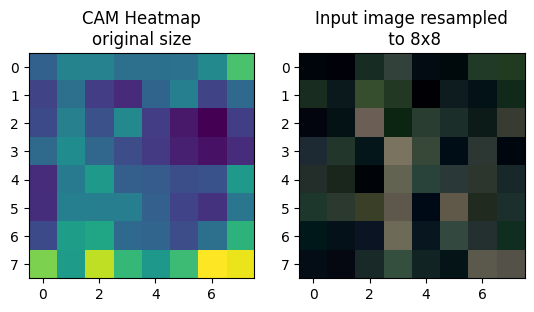

In [133]:
cam_npy = cam.cam.numpy()

plt.figure()
plt.subplot(121)
plt.imshow(cam_npy)
plt.title("CAM Heatmap\noriginal size")

plt.subplot(122)
plt.imshow(cv2.resize(x_i_orig,cam_npy.shape))
plt.title("Input image resampled\n to 8x8")

plt.show()

### **GradCAM for all conv layers**

List with all convolutional layers

In [134]:
list_conv_layers = []
for layer in vgg16_fine_tune.layers:
  if "conv" in layer.name:
    list_conv_layers.append(layer.name)
    print(layer.name)

block1_conv1
block1_conv2
block2_conv1
block2_conv2
block3_conv1
block3_conv2
block3_conv3
block4_conv1
block4_conv2
block4_conv3
block5_conv1
block5_conv2
block5_conv3


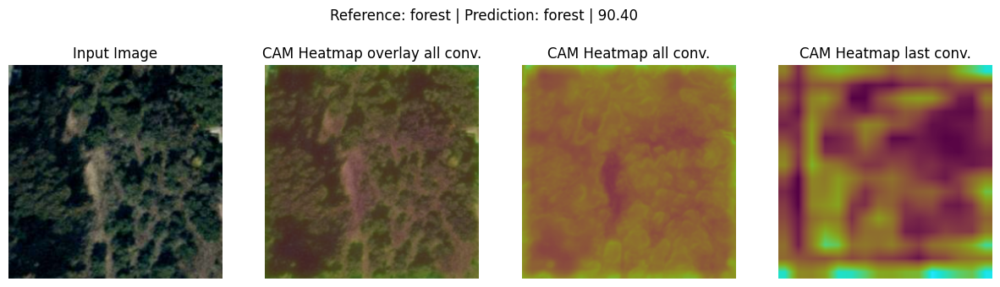

In [136]:
id = 113 # 6 8 106 50 103 200 180

# Reading the image, resize it
# add one dimension, convert to float
# apply preprocessing function for VGG16
x_i_orig = tifffile.imread(x_test[id])
x_i_orig = np.resize(x_i_orig,(256,256,3))
x_i = np.expand_dims(x_i_orig, axis=0)
x_i = x_i.astype("float")
x_i = preprocess_input(x_i)

# Prediction
preds = vgg16_fine_tune.predict(x_i,
                                verbose=0)
probs = preds[0].max()
id_class_pred = np.argmax(preds[0])
str_class_pred = list(classes_dict.keys())[id_class_pred]
str_class_ref = list(classes_dict.keys())[y_test[id]]

# GradCAM using all convolutional layers, get the heatmap
# and storage them
heatmaps = []
for layer in list_conv_layers:
  cam = GradCAM(vgg16_fine_tune,
                id_class_pred,
                layer_name=layer)
  heatmaps.append(cam.compute_heatmap(x_i))

heatmap_last = np.array(heatmaps[-1])
# compute the mean of all heatmaps
heatmap = np.mean(np.array(heatmaps), axis=0).astype(np.uint8)

# overlay the heatmap to the input image
(heatmap_last, output_last) = cam.overlay_heatmap(heatmap_last,
                                                  x_i_orig,
                                                  alpha=0.5)
(heatmap, output) = cam.overlay_heatmap(heatmap,
                                        x_i_orig,
                                        alpha=0.5)

# Plot with the reference and prediction, input image, overlay and heatmap
plt.figure(figsize=(15,4))

plt.subplot(1,4,1)
plt.imshow(x_i_orig)
plt.axis("off")
plt.title("Input Image")

plt.subplot(1,4,2)
plt.imshow(output)
plt.axis("off")
plt.title("CAM Heatmap overlay all conv.")

plt.subplot(1,4,3)
plt.imshow(heatmap)
plt.axis("off")
plt.title("CAM Heatmap all conv.")

plt.subplot(1,4,4)
plt.imshow(heatmap_last)
plt.axis("off")
plt.title("CAM Heatmap last conv.")

plt.suptitle("Reference: {} | Prediction: {} | {:.2f}".format(str_class_ref,
                                                             str_class_pred,
                                                             100*probs))
plt.show()

### **GradCAM Test set visualization**

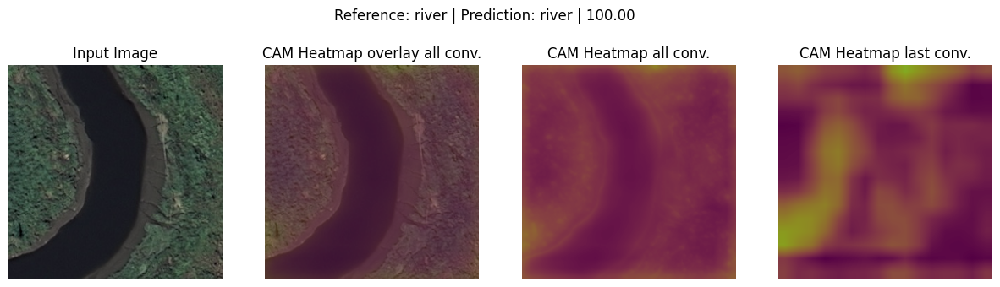

In [139]:
#@title Visualization { run: "auto", vertical-output: true }
#@markdown Double click here to show/hide code. Drag the slider to change the input image.

id = 142 #@param {type:"slider", min:0, max:419, step:1}
# 113 6 8 106 50 103 200 180

# Reading the image, resize it
# add one dimension, convert to float
# apply preprocessing function for VGG16
x_i_orig = tifffile.imread(x_test[id])
x_i_orig = np.resize(x_i_orig,(256,256,3))
x_i = np.expand_dims(x_i_orig, axis=0)
x_i = x_i.astype("float")
x_i = preprocess_input(x_i)

# Prediction
preds = vgg16_fine_tune.predict(x_i,
                                verbose=0)
probs = preds[0].max()
id_class_pred = np.argmax(preds[0])
str_class_pred = list(classes_dict.keys())[id_class_pred]
str_class_ref = list(classes_dict.keys())[y_test[id]]

# GradCAM using all convolutional layers, get the heatmap
# and storage them
heatmaps = []
for layer in list_conv_layers:
  cam = GradCAM(vgg16_fine_tune,
                id_class_pred,
                layer_name=layer)
  heatmaps.append(cam.compute_heatmap(x_i))

heatmap_last = np.array(heatmaps[-1])
# compute the mean of all heatmaps
heatmap = np.mean(np.array(heatmaps), axis=0).astype(np.uint8)

# overlay the heatmap to the input image
(heatmap_last, output_last) = cam.overlay_heatmap(heatmap_last,
                                                  x_i_orig,
                                                  alpha=0.5)
(heatmap, output) = cam.overlay_heatmap(heatmap,
                                        x_i_orig,
                                        alpha=0.5)

# Plot with the reference and prediction, input image, overlay and heatmap
plt.figure(figsize=(15,4))

plt.subplot(1,4,1)
plt.imshow(x_i_orig)
plt.axis("off")
plt.title("Input Image")

plt.subplot(1,4,2)
plt.imshow(output)
plt.axis("off")
plt.title("CAM Heatmap overlay all conv.")

plt.subplot(1,4,3)
plt.imshow(heatmap)
plt.axis("off")
plt.title("CAM Heatmap all conv.")

plt.subplot(1,4,4)
plt.imshow(heatmap_last)
plt.axis("off")
plt.title("CAM Heatmap last conv.")

plt.suptitle("Reference: {} | Prediction: {} | {:.2f}".format(str_class_ref,
                                                             str_class_pred,
                                                             100*probs))

plt.show()

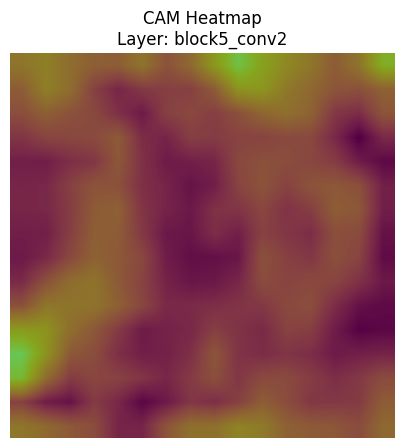

In [143]:
#@title Heatmaps of all convolutional layers  { run: "auto", vertical-output: true }
#@markdown Double click here to show/hide code. Drag the slider to change the layer.
i = 11 #@param {type:"slider", min:0, max:12, step:1}
hp = cv2.applyColorMap(heatmaps[i].astype(np.uint8),
                       cv2.COLORMAP_VIRIDIS)
plt.figure(figsize=(5,5))
plt.imshow(hp)
plt.title('CAM Heatmap\nLayer: {}'.format(list_conv_layers[i]))
plt.axis("off");